In [1]:
# Install Libraries
%pip install spacy
!python -m spacy download en_core_web_md
!pip install wordcloud

2023-07-18 06:16:48.855872: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-18 06:16:49.964548: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 MB 11.0 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_md')


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import spacy
from matplotlib.pyplot import imread
from wordcloud import WordCloud,STOPWORDS
import nltk

import warnings
warnings.filterwarnings('ignore')


In [3]:
data  = pd.read_csv("/content/Elon_musk.csv",encoding='Latin1')
data

,Unnamed: 0,Text
0,1,@kunalb11 Im an alien
1,2,@ID_AA_Carmack Ray tracing on Cyberpunk with H...
2,3,@joerogan @Spotify Great interview!
3,4,@gtera27 Doge is underestimated
4,5,@teslacn Congratulations Tesla China for amazi...
...,...,...
1994,1995,"@flcnhvy True, it sounds so surreal, but the n..."
1995,1996,@PPathole Make sure to read ur terms &amp; con...
1996,1997,@TeslaGong @PPathole Samwise Gamgee
1997,1998,@PPathole Altho Dumb and Dumber is <U+0001F525...


In [4]:
# Droping 1 column and Renaming another

data.drop(['Unnamed: 0'], axis=1, inplace=True)
data.head()

,Text
0,@kunalb11 Im an alien
1,@ID_AA_Carmack Ray tracing on Cyberpunk with H...
2,@joerogan @Spotify Great interview!
3,@gtera27 Doge is underestimated
4,@teslacn Congratulations Tesla China for amazi...


Text Preprocessing

In [5]:

data=[Text.strip() for Text in data.Text] # remove both the leading and the trailing characters
data=[Text for Text in data if Text] # removes empty strings, because they are considered in Python as False
data[0:10]

['@kunalb11 I\x92m an alien',
 '@ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it?',
 '@joerogan @Spotify Great interview!',
 '@gtera27 Doge is underestimated',
 '@teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!!',
 'Happy New Year of the Ox! https://t.co/9WFKMYu2oj',
 'Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all. https://t.co/zGxJFDzzrM',
 '@OwenSparks_ @flcnhvy @anonyx10 Haha thanks :)',
 '@flcnhvy @anonyx10 Indeed! Tweets definitely do not represent real-world time allocation.',
 'The most entertaining outcome is the most likely']

In [6]:
# Joining the list into one string/text
data_text=' '.join(data)
data_text

'@kunalb11 I\x92m an alien @ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it? @joerogan @Spotify Great interview! @gtera27 Doge is underestimated @teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!! Happy New Year of the Ox! https://t.co/9WFKMYu2oj Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all. https://t.co/zGxJFDzzrM @OwenSparks_ @flcnhvy @anonyx10 Haha thanks :) @flcnhvy @anonyx10 Indeed! Tweets definitely do not represent real-world time allocation. The most entertaining outcome is the most likely @GiveDirectly Just sent some Just agree to do Clubhouse with @kanyewest https://t.co/3rWE9uHSTS @geoffkeighley @UnrealEngine It\x92s getting real Bought some Dogecoin for lil X, so he can be a toddler hodler @JoshManMode He definitely has issues, but the sentencing seems a bit high @freewalletorg Thanks for fixing @freewalletorg Please unlock my account @AstroJordy <U+0001F923><U

In [7]:
# remove Twitter username handles from a given twitter text. (Removes @usernames)
from nltk.tokenize import TweetTokenizer
tknzr = TweetTokenizer(strip_handles=True)
data_tokens=tknzr.tokenize(data_text)
print(data_tokens)

['I', '\x92', 'm', 'an', 'alien', 'Ray', 'tracing', 'on', 'Cyberpunk', 'with', 'HDR', 'is', 'next-level', '.', 'Have', 'you', 'tried', 'it', '?', 'Great', 'interview', '!', 'Doge', 'is', 'underestimated', 'Congratulations', 'Tesla', 'China', 'for', 'amazing', 'execution', 'last', 'year', '.', 'Now', 'on', 'to', 'the', 'next', 'for', 'even', 'more', '!', '!', 'Happy', 'New', 'Year', 'of', 'the', 'Ox', '!', 'https://t.co/9WFKMYu2oj', 'Frodo', 'was', 'the', 'underdoge', ',', 'All', 'thought', 'he', 'would', 'fail', ',', 'Himself', 'most', 'of', 'all', '.', 'https://t.co/zGxJFDzzrM', 'Haha', 'thanks', ':)', 'Indeed', '!', 'Tweets', 'definitely', 'do', 'not', 'represent', 'real-world', 'time', 'allocation', '.', 'The', 'most', 'entertaining', 'outcome', 'is', 'the', 'most', 'likely', 'Just', 'sent', 'some', 'Just', 'agree', 'to', 'do', 'Clubhouse', 'with', 'https://t.co/3rWE9uHSTS', 'It', '\x92', 's', 'getting', 'real', 'Bought', 'some', 'Dogecoin', 'for', 'lil', 'X', ',', 'so', 'he', 'can'

In [8]:
# Again Joining the list into one string/text
data_tokens_text=' '.join(data_tokens)
data_tokens_text

'I \x92 m an alien Ray tracing on Cyberpunk with HDR is next-level . Have you tried it ? Great interview ! Doge is underestimated Congratulations Tesla China for amazing execution last year . Now on to the next for even more ! ! Happy New Year of the Ox ! https://t.co/9WFKMYu2oj Frodo was the underdoge , All thought he would fail , Himself most of all . https://t.co/zGxJFDzzrM Haha thanks :) Indeed ! Tweets definitely do not represent real-world time allocation . The most entertaining outcome is the most likely Just sent some Just agree to do Clubhouse with https://t.co/3rWE9uHSTS It \x92 s getting real Bought some Dogecoin for lil X , so he can be a toddler hodler He definitely has issues , but the sentencing seems a bit high Thanks for fixing Please unlock my account <U+0001F923> <U+0001F923> This is true power haha https://t.co/Fc9uhQSd7O Any crypto wallet that won \x92 t give you your private keys should be avoided at all costs Your app sucks RT : NASA has selected Falcon Heavy to 

In [9]:
# Remove Punctuations
Punctuations =data_tokens_text.translate(str.maketrans('','',string.punctuation))
Punctuations

'I \x92 m an alien Ray tracing on Cyberpunk with HDR is nextlevel  Have you tried it  Great interview  Doge is underestimated Congratulations Tesla China for amazing execution last year  Now on to the next for even more   Happy New Year of the Ox  httpstco9WFKMYu2oj Frodo was the underdoge  All thought he would fail  Himself most of all  httpstcozGxJFDzzrM Haha thanks  Indeed  Tweets definitely do not represent realworld time allocation  The most entertaining outcome is the most likely Just sent some Just agree to do Clubhouse with httpstco3rWE9uHSTS It \x92 s getting real Bought some Dogecoin for lil X  so he can be a toddler hodler He definitely has issues  but the sentencing seems a bit high Thanks for fixing Please unlock my account U0001F923 U0001F923 This is true power haha httpstcoFc9uhQSd7O Any crypto wallet that won \x92 t give you your private keys should be avoided at all costs Your app sucks RT  NASA has selected Falcon Heavy to launch the first two elements of the lunar Ga

In [10]:
# remove https or url within text
import re
url=re.sub(r'http\S+', '', Punctuations )
url

'I \x92 m an alien Ray tracing on Cyberpunk with HDR is nextlevel  Have you tried it  Great interview  Doge is underestimated Congratulations Tesla China for amazing execution last year  Now on to the next for even more   Happy New Year of the Ox   Frodo was the underdoge  All thought he would fail  Himself most of all   Haha thanks  Indeed  Tweets definitely do not represent realworld time allocation  The most entertaining outcome is the most likely Just sent some Just agree to do Clubhouse with  It \x92 s getting real Bought some Dogecoin for lil X  so he can be a toddler hodler He definitely has issues  but the sentencing seems a bit high Thanks for fixing Please unlock my account U0001F923 U0001F923 This is true power haha  Any crypto wallet that won \x92 t give you your private keys should be avoided at all costs Your app sucks RT  NASA has selected Falcon Heavy to launch the first two elements of the lunar Gateway together on one mission   Yes Once we can predict cash flow reason

In [11]:
#Tokenization
from nltk.tokenize import word_tokenize
nltk.download('punkt')
text_tokens=word_tokenize(url)
print(text_tokens)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


['I', '\x92', 'm', 'an', 'alien', 'Ray', 'tracing', 'on', 'Cyberpunk', 'with', 'HDR', 'is', 'nextlevel', 'Have', 'you', 'tried', 'it', 'Great', 'interview', 'Doge', 'is', 'underestimated', 'Congratulations', 'Tesla', 'China', 'for', 'amazing', 'execution', 'last', 'year', 'Now', 'on', 'to', 'the', 'next', 'for', 'even', 'more', 'Happy', 'New', 'Year', 'of', 'the', 'Ox', 'Frodo', 'was', 'the', 'underdoge', 'All', 'thought', 'he', 'would', 'fail', 'Himself', 'most', 'of', 'all', 'Haha', 'thanks', 'Indeed', 'Tweets', 'definitely', 'do', 'not', 'represent', 'realworld', 'time', 'allocation', 'The', 'most', 'entertaining', 'outcome', 'is', 'the', 'most', 'likely', 'Just', 'sent', 'some', 'Just', 'agree', 'to', 'do', 'Clubhouse', 'with', 'It', '\x92', 's', 'getting', 'real', 'Bought', 'some', 'Dogecoin', 'for', 'lil', 'X', 'so', 'he', 'can', 'be', 'a', 'toddler', 'hodler', 'He', 'definitely', 'has', 'issues', 'but', 'the', 'sentencing', 'seems', 'a', 'bit', 'high', 'Thanks', 'for', 'fixing',

In [12]:
# Tokens count
len(text_tokens)

17847

In [13]:
# Remove Stopwords
from nltk.corpus import stopwords
nltk.download('stopwords')
my_stop_words=stopwords.words('english')

sw_list = ['\x92','rt','ye','yeah','haha','Yes','U0001F923','I']
my_stop_words.extend(sw_list)

no_stop_tokens=[word for word in text_tokens if not word in my_stop_words]
print(no_stop_tokens)

['alien', 'Ray', 'tracing', 'Cyberpunk', 'HDR', 'nextlevel', 'Have', 'tried', 'Great', 'interview', 'Doge', 'underestimated', 'Congratulations', 'Tesla', 'China', 'amazing', 'execution', 'last', 'year', 'Now', 'next', 'even', 'Happy', 'New', 'Year', 'Ox', 'Frodo', 'underdoge', 'All', 'thought', 'would', 'fail', 'Himself', 'Haha', 'thanks', 'Indeed', 'Tweets', 'definitely', 'represent', 'realworld', 'time', 'allocation', 'The', 'entertaining', 'outcome', 'likely', 'Just', 'sent', 'Just', 'agree', 'Clubhouse', 'It', 'getting', 'real', 'Bought', 'Dogecoin', 'lil', 'X', 'toddler', 'hodler', 'He', 'definitely', 'issues', 'sentencing', 'seems', 'bit', 'high', 'Thanks', 'fixing', 'Please', 'unlock', 'account', 'This', 'true', 'power', 'Any', 'crypto', 'wallet', 'give', 'private', 'keys', 'avoided', 'costs', 'Your', 'app', 'sucks', 'RT', 'NASA', 'selected', 'Falcon', 'Heavy', 'launch', 'first', 'two', 'elements', 'lunar', 'Gateway', 'together', 'one', 'mission', 'Once', 'predict', 'cash', 'flo

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [14]:
# Normalize the data
lower_words=[Text.lower() for Text in no_stop_tokens]
print(lower_words[100:200])

['once', 'predict', 'cash', 'flow', 'reasonably', 'well', 'starlink', 'ipo', 'starlink', 'staggeringly', 'difficult', 'technical', 'economic', 'endeavor', 'however', 'spacex', 'needs', 'pass', 'deep', 'chasm', 'negative', 'cash', 'flow', 'next', 'year', 'lowest', 'cost', 'per', 'ton', 'carbon', 'sequestered', 'net', 'value', 'product', 'made', 'must', 'scalable', 'g', 'it', 'meant', 'price', 'countries', 'only', 'difference', 'taxes', 'shipping', 'this', 'intended', 'earth', 'may', 'ideas', 'apply', 'mars', 'xprize', 'team', 'manage', '100m', 'carbon', 'capture', 'prize', 'everyone', 'tesla', 'receives', 'stock', 'my', 'comp', 'stock', 'options', 'take', 'table', 'that', 'missing', 'back', 'work', 'go', 'does', 'seem', 'bit', 'high', 'doge', 'appears', 'inflationary', 'meaningfully', 'fixed', 'coins', 'per', 'unit', 'time', 'whereas', 'wow', '1', 'orbital', 'launch', 'tower', 'stack', '2', 'enough', 'raptors', 'orbit', 'booster']


In [15]:
# Stemming (Optional)
from nltk.stem import PorterStemmer
ps=PorterStemmer()
stemmed_tokens=[ps.stem(word) for word in lower_words]
print(stemmed_tokens[100:200])

['onc', 'predict', 'cash', 'flow', 'reason', 'well', 'starlink', 'ipo', 'starlink', 'staggeringli', 'difficult', 'technic', 'econom', 'endeavor', 'howev', 'spacex', 'need', 'pass', 'deep', 'chasm', 'neg', 'cash', 'flow', 'next', 'year', 'lowest', 'cost', 'per', 'ton', 'carbon', 'sequest', 'net', 'valu', 'product', 'made', 'must', 'scalabl', 'g', 'it', 'meant', 'price', 'countri', 'onli', 'differ', 'tax', 'ship', 'thi', 'intend', 'earth', 'may', 'idea', 'appli', 'mar', 'xprize', 'team', 'manag', '100m', 'carbon', 'captur', 'prize', 'everyon', 'tesla', 'receiv', 'stock', 'my', 'comp', 'stock', 'option', 'take', 'tabl', 'that', 'miss', 'back', 'work', 'go', 'doe', 'seem', 'bit', 'high', 'doge', 'appear', 'inflationari', 'meaning', 'fix', 'coin', 'per', 'unit', 'time', 'wherea', 'wow', '1', 'orbit', 'launch', 'tower', 'stack', '2', 'enough', 'raptor', 'orbit', 'booster']


In [16]:
# Lemmatization
#!python -m spacy download en
nlp=spacy.load('en_core_web_sm')
doc=nlp(' '.join(lower_words))
print(doc)

alien ray tracing cyberpunk hdr nextlevel have tried great interview doge underestimated congratulations tesla china amazing execution last year now next even happy new year ox frodo underdoge all thought would fail himself haha thanks indeed tweets definitely represent realworld time allocation the entertaining outcome likely just sent just agree clubhouse it getting real bought dogecoin lil x toddler hodler he definitely issues sentencing seems bit high thanks fixing please unlock account this true power any crypto wallet give private keys avoided costs your app sucks rt nasa selected falcon heavy launch first two elements lunar gateway together one mission once predict cash flow reasonably well starlink ipo starlink staggeringly difficult technical economic endeavor however spacex needs pass deep chasm negative cash flow next year lowest cost per ton carbon sequestered net value product made must scalable g it meant price countries only difference taxes shipping this intended earth 

In [17]:
lemmas=[token.lemma_ for token in doc]
print(lemmas)

['alien', 'ray', 'trace', 'cyberpunk', 'hdr', 'nextlevel', 'have', 'try', 'great', 'interview', 'doge', 'underestimate', 'congratulation', 'tesla', 'china', 'amazing', 'execution', 'last', 'year', 'now', 'next', 'even', 'happy', 'new', 'year', 'ox', 'frodo', 'underdoge', 'all', 'thought', 'would', 'fail', 'himself', 'haha', 'thank', 'indeed', 'tweet', 'definitely', 'represent', 'realworld', 'time', 'allocation', 'the', 'entertaining', 'outcome', 'likely', 'just', 'send', 'just', 'agree', 'clubhouse', 'it', 'get', 'real', 'buy', 'dogecoin', 'lil', 'x', 'toddler', 'hodler', 'he', 'definitely', 'issue', 'sentencing', 'seem', 'bit', 'high', 'thank', 'fix', 'please', 'unlock', 'account', 'this', 'true', 'power', 'any', 'crypto', 'wallet', 'give', 'private', 'key', 'avoid', 'cost', 'your', 'app', 'suck', 'rt', 'nasa', 'select', 'falcon', 'heavy', 'launch', 'first', 'two', 'element', 'lunar', 'gateway', 'together', 'one', 'mission', 'once', 'predict', 'cash', 'flow', 'reasonably', 'well', 'st

In [18]:
clean_tweets=' '.join(lemmas)
clean_tweets

'alien ray trace cyberpunk hdr nextlevel have try great interview doge underestimate congratulation tesla china amazing execution last year now next even happy new year ox frodo underdoge all thought would fail himself haha thank indeed tweet definitely represent realworld time allocation the entertaining outcome likely just send just agree clubhouse it get real buy dogecoin lil x toddler hodler he definitely issue sentencing seem bit high thank fix please unlock account this true power any crypto wallet give private key avoid cost your app suck rt nasa select falcon heavy launch first two element lunar gateway together one mission once predict cash flow reasonably well starlink ipo starlink staggeringly difficult technical economic endeavor however spacex need pass deep chasm negative cash flow next year low cost per ton carbon sequester net value product make must scalable g it mean price country only difference taxis ship this intend earth may idea apply mar xprize team manage 100 m

Data Exploration

In [24]:
import pandas as pd

# Assuming data is a list
data = pd.DataFrame(data, columns=['Text'])

# Calculate word count
data['word_count'] = data['Text'].apply(lambda x: len(x.split(" ")))

# Display the results
data[['Text', 'word_count']].head()


,Text,word_count
0,@kunalb11 Im an alien,4
1,@ID_AA_Carmack Ray tracing on Cyberpunk with H...,13
2,@joerogan @Spotify Great interview!,4
3,@gtera27 Doge is underestimated,4
4,@teslacn Congratulations Tesla China for amazi...,17


In [25]:
# Number of charatcters
data['char_count'] = data['Text'].str.len()
data[['Text','char_count']].head()

,Text,char_count
0,@kunalb11 Im an alien,22
1,@ID_AA_Carmack Ray tracing on Cyberpunk with H...,82
2,@joerogan @Spotify Great interview!,35
3,@gtera27 Doge is underestimated,31
4,@teslacn Congratulations Tesla China for amazi...,104


In [26]:
# Average word length

def avg_word(sentence):
  words = sentence.split()
  return (sum(len(word)for word in words)/len(words))

data['avg_word'] = data['Text'].apply(lambda x: avg_word(x))
data[['Text','avg_word']].head()

,Text,avg_word
0,@kunalb11 Im an alien,4.750000
1,@ID_AA_Carmack Ray tracing on Cyberpunk with H...,5.384615
2,@joerogan @Spotify Great interview!,8.000000
3,@gtera27 Doge is underestimated,7.000000
4,@teslacn Congratulations Tesla China for amazi...,5.176471


In [27]:
# Number of Stop Words
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [28]:
from nltk.corpus import stopwords

stop = stopwords.words('english')

data['stopwords'] = data['Text'].apply(lambda x: len([x for x in x.split() if x in stop]))
data[['Text','stopwords']].head()

,Text,stopwords
0,@kunalb11 Im an alien,1
1,@ID_AA_Carmack Ray tracing on Cyberpunk with H...,4
2,@joerogan @Spotify Great interview!,0
3,@gtera27 Doge is underestimated,1
4,@teslacn Congratulations Tesla China for amazi...,5


In [29]:
# Number of Spacial Characters

data['hashtags'] = data['Text'].apply(lambda x: len([x for x in x.split() if x.startswith('#')]))
data[['Text','hashtags']].head()

,Text,hashtags
0,@kunalb11 Im an alien,0
1,@ID_AA_Carmack Ray tracing on Cyberpunk with H...,0
2,@joerogan @Spotify Great interview!,0
3,@gtera27 Doge is underestimated,0
4,@teslacn Congratulations Tesla China for amazi...,0


In [30]:
# Number of numerics

data['numerics'] = data['Text'].apply(lambda x: len([x for x in x.split() if x.isdigit()]))
data[['Text','numerics']].head()

,Text,numerics
0,@kunalb11 Im an alien,0
1,@ID_AA_Carmack Ray tracing on Cyberpunk with H...,0
2,@joerogan @Spotify Great interview!,0
3,@gtera27 Doge is underestimated,0
4,@teslacn Congratulations Tesla China for amazi...,0


In [31]:
data.drop(['numerics','hashtags','stopwords','avg_word','char_count','word_count'],axis=1,inplace=True)


In [32]:
# Check null values

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1999 entries, 0 to 1998
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Text    1999 non-null   object
dtypes: object(1)
memory usage: 15.7+ KB


As We  can see there are no null Values


**Regular** **Expression**

In [33]:
import re
import string

def clean_text(text):
    '''Make text lowercase, remove text in square brackets, remove punctuation and remove words containing numbers.'''
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub("[0-9" "]+"," ",text)
    text = re.sub('[‘’“”…]', '', text)
    return text

clean = lambda x: clean_text(x)

In [34]:
data['Text'] = data.Text.apply(clean)
data.Text

0                                            im an alien
1       idaacarmack ray tracing on cyberpunk with hdr ...
2                        joerogan spotify great interview
3                                  doge is underestimated
4       teslacn congratulations tesla china for amazin...
                              ...                        
1994    flcnhvy true it sounds so surreal but the nega...
1995    ppathole make sure to read ur terms amp condit...
1996                    teslagong ppathole samwise gamgee
1997                   ppathole altho dumb and dumber is 
1998                              progress update august 
Name: Text, Length: 1999, dtype: object

In [35]:
freq = pd.Series(' '.join(data['Text']).split()).value_counts()[:20] # for top 20
freq

the               486
to                400
a                 355
is                355
of                315
spacex            239
in                219
amp               218
for               194
tesla             166
will              165
be                157
erdayastronaut    142
this              140
it                137
we                135
on                129
that              127
rt                127
but               126
dtype: int64

In [36]:
from nltk.corpus import stopwords
stop = stopwords.words('english')
data['Text'] = data['Text'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))


In [37]:
freq_Sw = pd.Series(' '.join(data['Text']).split()).value_counts()[:20] # for top 20
freq_Sw

spacex             239
amp                218
tesla              166
erdayastronaut     142
rt                 127
ppathole           123
flcnhvy            114
yes                 86
great               76
teslaownerssv       73
wholemarsblog       68
teslarati           59
its                56
haha                55
nasaspaceflight     55
good                51
launch              49
sure                43
yeah                41
would               40
dtype: int64

In [45]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd
import numpy as np

# Assuming data is a DataFrame with a 'Text' column
data = pd.DataFrame(data, columns=['Text'])

# Create an instance of CountVectorizer
vectorizer = CountVectorizer(min_df=1, max_df=0.9)

# Fit and transform the 'Text' column
X = vectorizer.fit_transform(data['Text'])

# Get the feature names and their occurrences
feature_names = list(vectorizer.vocabulary_.keys())
occurrences = np.asarray(X.sum(axis=0)).ravel().tolist()

# Create a DataFrame to store the word frequency information
word_freq_df = pd.DataFrame({'term': feature_names, 'occurrences': occurrences})

# Calculate the frequency
word_freq_df['frequency'] = word_freq_df['occurrences'] / np.sum(word_freq_df['occurrences'])

# Display the word frequency DataFrame
print(word_freq_df)


             term  occurrences  frequency
0           alien            1   0.000075
1     idaacarmack            6   0.000449
2             ray            1   0.000075
3         tracing            1   0.000075
4       cyberpunk            3   0.000224
...           ...          ...        ...
4456     clicking            1   0.000075
4457       accept            1   0.000075
4458      samwise            1   0.000075
4459       gamgee            1   0.000075
4460        altho            1   0.000075

[4461 rows x 3 columns]


In [50]:
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
import numpy as np

# Assuming data is a DataFrame with a 'Text' column
data = pd.DataFrame(data, columns=['Text'])

# Create an instance of TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words='english', max_features=1000, max_df=0.5, smooth_idf=True)

# Fit and transform the 'Text' column
doc_vec = vectorizer.fit_transform(data['Text'])

# Get the feature names from the CountVectorizer
feature_names = list(vectorizer.vocabulary_.keys())
occurrences = np.asarray(X.sum(axis=0)).ravel().tolist()

# Convert the sparse matrix to a dense matrix and convert it to a list
dense = doc_vec.todense()
denselist = dense.tolist()

# Create a DataFrame to store the TF-IDF values
tfidf_df = pd.DataFrame(denselist, columns=feature_names)



      idaacarmack  cyberpunk  tried  great  interview  doge  teslacn  \
0             0.0        0.0    0.0    0.0        0.0   0.0      0.0   
1             0.0        0.0    0.0    0.0        0.0   0.0      0.0   
2             0.0        0.0    0.0    0.0        0.0   0.0      0.0   
3             0.0        0.0    0.0    0.0        0.0   0.0      0.0   
4             0.0        0.0    0.0    0.0        0.0   0.0      0.0   
...           ...        ...    ...    ...        ...   ...      ...   
1994          0.0        0.0    0.0    0.0        0.0   0.0      0.0   
1995          0.0        0.0    0.0    0.0        0.0   0.0      0.0   
1996          0.0        0.0    0.0    0.0        0.0   0.0      0.0   
1997          0.0        0.0    0.0    0.0        0.0   0.0      0.0   
1998          0.0        0.0    0.0    0.0        0.0   0.0      0.0   

      congratulations  tesla  china  ...  astrobehnken  bring  shravantr  \
0                 0.0    0.0    0.0  ...           0.0    0

In [52]:
# Display the TF-IDF DataFrame
print(tfidf_df)


      idaacarmack  cyberpunk  tried  great  interview  doge  teslacn  \
0             0.0        0.0    0.0    0.0        0.0   0.0      0.0   
1             0.0        0.0    0.0    0.0        0.0   0.0      0.0   
2             0.0        0.0    0.0    0.0        0.0   0.0      0.0   
3             0.0        0.0    0.0    0.0        0.0   0.0      0.0   
4             0.0        0.0    0.0    0.0        0.0   0.0      0.0   
...           ...        ...    ...    ...        ...   ...      ...   
1994          0.0        0.0    0.0    0.0        0.0   0.0      0.0   
1995          0.0        0.0    0.0    0.0        0.0   0.0      0.0   
1996          0.0        0.0    0.0    0.0        0.0   0.0      0.0   
1997          0.0        0.0    0.0    0.0        0.0   0.0      0.0   
1998          0.0        0.0    0.0    0.0        0.0   0.0      0.0   

      congratulations  tesla  china  ...  astrobehnken  bring  shravantr  \
0                 0.0    0.0    0.0  ...           0.0    0

In [53]:
def get_top_n2_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(2,2),  #for tri-gram, put ngram_range=(3,3)
            max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1],
                reverse=True)
    return words_freq[:n]

In [54]:
top2_words = get_top_n2_words(data["Text"], n=200) #top 200
top2_df = pd.DataFrame(top2_words)
top2_df.columns=["Bi-gram", "Freq"]
top2_df.head()

,Bi-gram,Freq
0,rt spacex,71
1,we re,26
2,spacex falcon,17
3,erdayastronaut spacex,16
4,crew dragon,13


Visualization

[Text(0, 0, 'rt spacex'),
 Text(1, 0, 'we re'),
 Text(2, 0, 'spacex falcon'),
 Text(3, 0, 'erdayastronaut spacex'),
 Text(4, 0, 'crew dragon'),
 Text(5, 0, 'pretty much'),
 Text(6, 0, 'rt nasa'),
 Text(7, 0, 'waemd spacex'),
 Text(8, 0, 'you re'),
 Text(9, 0, 'giga berlin'),
 Text(10, 0, 'first stage'),
 Text(11, 0, 'teslaratiteam teslarati'),
 Text(12, 0, 'nasa spacex'),
 Text(13, 0, 'falcon first'),
 Text(14, 0, 'next week'),
 Text(15, 0, 'erdayastronaut flcnhvy'),
 Text(16, 0, 'they re'),
 Text(17, 0, 'flcnhvy tesla'),
 Text(18, 0, 'coming soon'),
 Text(19, 0, 'spacex dragon')]

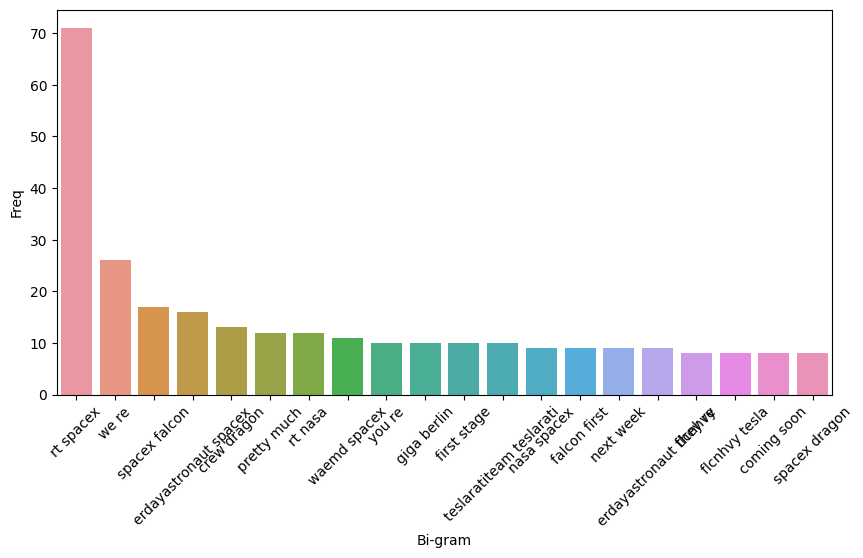

In [55]:
top20_bigram = top2_df.iloc[0:20,:]
fig = plt.figure(figsize = (10, 5))
plot=sns.barplot(x=top20_bigram["Bi-gram"],y=top20_bigram["Freq"])
plot.set_xticklabels(rotation=45,labels = top20_bigram["Bi-gram"])

In [56]:
def get_top_n3_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(3,3),
           max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1],
                reverse=True)
    return words_freq[:n]

In [57]:
top3_words = get_top_n3_words(data["Text"], n=200)
top3_df = pd.DataFrame(top3_words)
top3_df.columns=["Tri-gram", "Freq"]

[Text(0, 0, 'rt spacex falcon'),
 Text(1, 0, 'falcon first stage'),
 Text(2, 0, 'spacex falcon first'),
 Text(3, 0, 'thesheetztweetz waemd spacex'),
 Text(4, 0, 'course still love'),
 Text(5, 0, 'ppathole thesheetztweetz waemd'),
 Text(6, 0, 'waemd spacex spacexstarlink'),
 Text(7, 0, 'first stage landed'),
 Text(8, 0, 'rt spacex liftoff'),
 Text(9, 0, 'spacex spacexstarlink wanationalguard'),
 Text(10, 0, 'spacex felixschlang marcushousegame'),
 Text(11, 0, 'still love droneship'),
 Text(12, 0, 'rt spacex dragon'),
 Text(13, 0, 'dragon first operational'),
 Text(14, 0, 'first operational mission'),
 Text(15, 0, 'casparstanley ercxspace marcushousegame'),
 Text(16, 0, 'ercxspace marcushousegame felixschlang'),
 Text(17, 0, 'erdayastronaut joshbickett ajtourville'),
 Text(18, 0, 'joshbickett ajtourville spacex'),
 Text(19, 0, 'spacex falcon launches')]

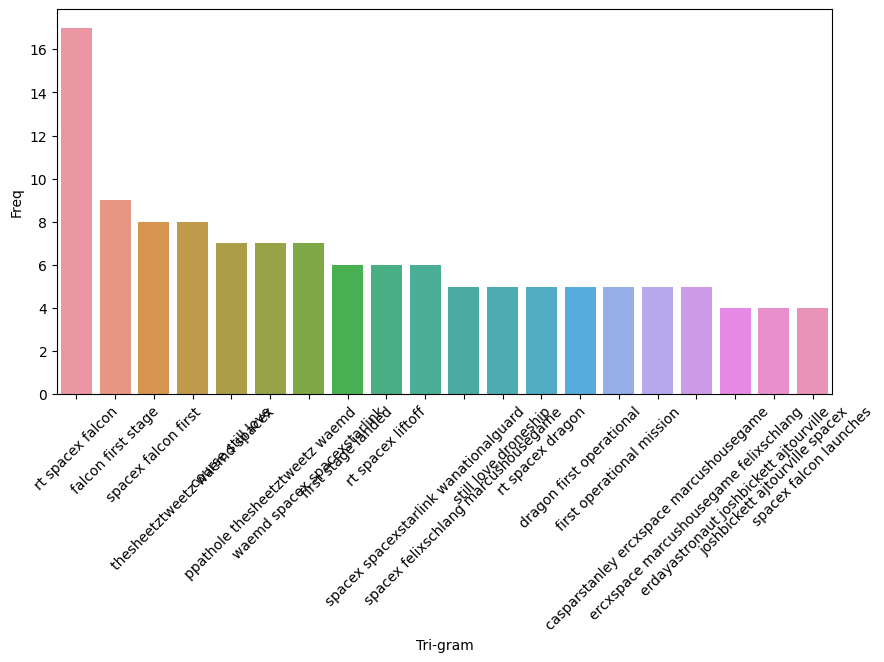

In [58]:
top20_trigram = top3_df.iloc[0:20,:]
fig = plt.figure(figsize = (10, 5))
plot=sns.barplot(x=top20_trigram["Tri-gram"],y=top20_trigram["Freq"])
plot.set_xticklabels(rotation=45,labels = top20_trigram["Tri-gram"])

In [59]:
string_Total = " ".join(data["Text"])

**Word** **Cloud**

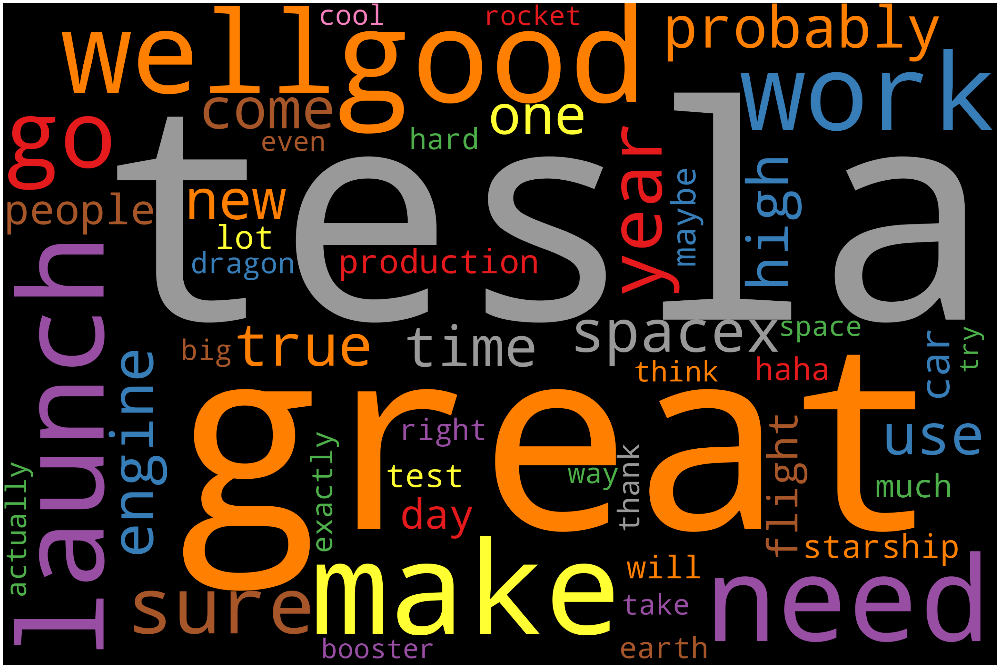

In [60]:
from wordcloud import WordCloud
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')

# Generate Word Cloud

STOPWORDS.add('pron')
STOPWORDS.add('rt')
STOPWORDS.add('yeah')
wordcloud=WordCloud(width=3000,height=2000,background_color='black',max_words=50,
                   colormap='Set1',stopwords=STOPWORDS).generate(clean_tweets)
plot_cloud(wordcloud)

** Name Entity Recongnition (NER)**

In [61]:
# Parts Of Speech (POS) Tagging
nlp=spacy.load('en_core_web_sm')

one_block=clean_tweets
doc_block=nlp(one_block)
spacy.displacy.render(doc_block,style='ent',jupyter=True)

In [62]:
for token in doc_block[100:200]:
    print(token,token.pos_)

once ADV
predict VERB
cash NOUN
flow NOUN
reasonably ADV
well ADV
starlink NOUN
ipo PROPN
starlink NOUN
staggeringly ADV
difficult ADJ
technical ADJ
economic ADJ
endeavor NOUN
however ADV
spacex VERB
need AUX
pass VERB
deep ADJ
chasm ADJ
negative ADJ
cash NOUN
flow NOUN
next ADJ
year NOUN
low ADJ
cost NOUN
per ADP
ton NOUN
carbon NOUN
sequester NOUN
net ADJ
value NOUN
product NOUN
make VERB
must AUX
scalable VERB
g ADP
it PRON
mean VERB
price NOUN
country NOUN
only ADV
difference NOUN
taxis NOUN
ship NOUN
this PRON
intend VERB
earth NOUN
may AUX
idea NOUN
apply VERB
mar PROPN
xprize PROPN
team NOUN
manage VERB
100 NUM
m PROPN
carbon NOUN
capture NOUN
prize NOUN
everyone PRON
tesla NOUN
receive VERB
stock NOUN
my PRON
comp NOUN
stock NOUN
option NOUN
take VERB
table NOUN
that PRON
miss VERB
back ADP
work NOUN
go VERB
do AUX
seem VERB
bit NOUN
high ADJ
doge PROPN
appear VERB
inflationary ADJ
meaningfully ADV
fix VERB
coin PROPN
per ADP
unit NOUN
time NOUN
whereas SCONJ
wow INTJ
1 NUM
orb

In [63]:
# Filtering the nouns and verbs only
nouns_verbs=[token.text for token in doc_block if token.pos_ in ('NOUN','VERB')]
print(nouns_verbs[100:200])

['time', 'launch', 'tower', 'stack', 'raptor', 'orbit', 'booster', 'improve', 'ship', 'booster', 'mass', 'back', 'work', 'tonight', 'video', 'people', 'speak', 'cute', 'image', 'reflect', 'time', 'cost', 'people', 'rain', 'pain', 'u0001f3b6', 'let', 'doge', 'rainforest', 'come', 'crypto', 'simplicity', 'genius', 'decade', 'work', 'look', 'note', 'email', 'text', 'lesson', 'learn', 'earth', 'time', 'tell', 'story', 'tesla', 'read', 'kingdom', 'hear', 'name', 'year', 'dogecake', 'thing', 'restaurant', 'hang', 'currency', 'earth', 'scratch', 'destiny', 'franz', 'say', 'ship', 'landing', 'burn', 'solution', 'greate', 'use', 'gas', 'maneuvering', 'rcs', 'thruster', 'seem', 'raptor', 'launch', 'mission', 'collect', 'datum', 'galaxy', 'explore', 'launch', 'starlink', 'satellite', 'orbit', 'mission', 'pad', '39a', 'deck', 'default', 'engine', 'lever', 'arm', 'shut', 'engine', 'min', 'throttle', 'point', 'flameout', 'risk', 'start', 'engine']


In [64]:
# Counting the noun & verb tokens
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()

X=cv.fit_transform(nouns_verbs)
sum_words=X.sum(axis=0)

words_freq=[(word,sum_words[0,idx]) for word,idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq, key=lambda x: x[1], reverse=True)

wd_df=pd.DataFrame(words_freq)
wd_df.columns=['word','count']
wd_df[0:10] # viewing top ten results

,word,count
0,tesla,76
1,make,64
2,launch,62
3,year,49
4,work,49
5,need,48
6,go,43
7,come,42
8,day,38
9,get,37


TWO
1)Extract reviews of any product from ecommerce website like amazon 2) Perform emotion mining

In [65]:
!pip install scrapy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 277.2/277.2 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 61.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 93.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.0/59.0 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.0/247.0 kB 20.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.3/93.3 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.6/74.6 kB 7.7 MB/s eta 0:00:00


In [66]:
# Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import string
import spacy

from matplotlib.pyplot import imread
from wordcloud import WordCloud, STOPWORDS
%matplotlib inline

In [68]:
# Import extracted amazon reviews Dataset
import pandas as pd
reviews=pd.read_csv("/content/extract_reviews.csv")
reviews

,stars,comment
0,5.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Delivered on time ...
1,5.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Delivered on time ...
2,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Let me sum up my m...
3,5.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Pros:Form factor i...
4,5.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Nice and small pho...
...,...,...
1195,5.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n It’s a powerful an...
1196,5.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Handy and easy to ...
1197,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Product is just fa...
1198,5.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Anything and every...


In [69]:
reviews=[comment.strip() for comment in reviews.comment] # remove both the leading and the trailing characters
reviews=[comment for comment in reviews if comment] # removes empty strings, because they are considered in Python as False
reviews[0:10]

['Delivered on time and the product was as per specs. No cheating.',
 'Delivered on time and the product was as per specs. No cheating.',
 "Let me sum up my mind here. I hate Iphones. I used to have an work phone (Iphone SE).Being a Sony Xperia user since Sony Arc times, I didn't have a choice to move away form the Sony portfolio as they don't sell in India anymore. My XZ1 is still working after 5.5 years, but she is getting old. And I repeat I hate IPhones.After much deliberation between 12, 13 and 13 Mini, I went with 13 Mini.1. I really wanted a phone I could use in a single hand, it fits perfect.2. I got a great deal on the purchase, as the net amt I paid was Rs. 58,900 after card discounts. So it is cheaper than a lot of Android phones with high end configuration.3. Performance. It is smooth and fast.4. Face Id works. I don't like it, but it works, I miss the Touch Id, but i knew what I was getting. So no complains.5. The Starlight colour is beautiful. I love whites.6. Camera is b

In [70]:
# joining the list into string\text

reviews_text = ' '.join(reviews)
reviews_text

'Delivered on time and the product was as per specs. No cheating. Delivered on time and the product was as per specs. No cheating. Let me sum up my mind here. I hate Iphones. I used to have an work phone (Iphone SE).Being a Sony Xperia user since Sony Arc times, I didn\'t have a choice to move away form the Sony portfolio as they don\'t sell in India anymore. My XZ1 is still working after 5.5 years, but she is getting old. And I repeat I hate IPhones.After much deliberation between 12, 13 and 13 Mini, I went with 13 Mini.1. I really wanted a phone I could use in a single hand, it fits perfect.2. I got a great deal on the purchase, as the net amt I paid was Rs. 58,900 after card discounts. So it is cheaper than a lot of Android phones with high end configuration.3. Performance. It is smooth and fast.4. Face Id works. I don\'t like it, but it works, I miss the Touch Id, but i knew what I was getting. So no complains.5. The Starlight colour is beautiful. I love whites.6. Camera is brillia

In [71]:
# Removing the punctuations

no_punc_text = reviews_text.translate(str.maketrans('','',string.punctuation))
no_punc_text

'Delivered on time and the product was as per specs No cheating Delivered on time and the product was as per specs No cheating Let me sum up my mind here I hate Iphones I used to have an work phone Iphone SEBeing a Sony Xperia user since Sony Arc times I didnt have a choice to move away form the Sony portfolio as they dont sell in India anymore My XZ1 is still working after 55 years but she is getting old And I repeat I hate IPhonesAfter much deliberation between 12 13 and 13 Mini I went with 13 Mini1 I really wanted a phone I could use in a single hand it fits perfect2 I got a great deal on the purchase as the net amt I paid was Rs 58900 after card discounts So it is cheaper than a lot of Android phones with high end configuration3 Performance It is smooth and fast4 Face Id works I dont like it but it works I miss the Touch Id but i knew what I was getting So no complains5 The Starlight colour is beautiful I love whites6 Camera is brilliant I am a point shoot not a camera buff My Sony

In [72]:
# Tokenization
import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [73]:
from nltk import word_tokenize
text_tokens=word_tokenize(no_punc_text)
print(text_tokens[0:50])

['Delivered', 'on', 'time', 'and', 'the', 'product', 'was', 'as', 'per', 'specs', 'No', 'cheating', 'Delivered', 'on', 'time', 'and', 'the', 'product', 'was', 'as', 'per', 'specs', 'No', 'cheating', 'Let', 'me', 'sum', 'up', 'my', 'mind', 'here', 'I', 'hate', 'Iphones', 'I', 'used', 'to', 'have', 'an', 'work', 'phone', 'Iphone', 'SEBeing', 'a', 'Sony', 'Xperia', 'user', 'since', 'Sony', 'Arc']


In [74]:
len(text_tokens)

102840

In [75]:
from nltk.corpus import stopwords

my_stop_words = stopwords.words('english')

sw_list = ['I','It','The','A']
my_stop_words.extend(sw_list)

no_stop_tokens = [word for word in text_tokens if not word in my_stop_words]
print(no_stop_tokens)

['Delivered', 'time', 'product', 'per', 'specs', 'No', 'cheating', 'Delivered', 'time', 'product', 'per', 'specs', 'No', 'cheating', 'Let', 'sum', 'mind', 'hate', 'Iphones', 'used', 'work', 'phone', 'Iphone', 'SEBeing', 'Sony', 'Xperia', 'user', 'since', 'Sony', 'Arc', 'times', 'didnt', 'choice', 'move', 'away', 'form', 'Sony', 'portfolio', 'dont', 'sell', 'India', 'anymore', 'My', 'XZ1', 'still', 'working', '55', 'years', 'getting', 'old', 'And', 'repeat', 'hate', 'IPhonesAfter', 'much', 'deliberation', '12', '13', '13', 'Mini', 'went', '13', 'Mini1', 'really', 'wanted', 'phone', 'could', 'use', 'single', 'hand', 'fits', 'perfect2', 'got', 'great', 'deal', 'purchase', 'net', 'amt', 'paid', 'Rs', '58900', 'card', 'discounts', 'So', 'cheaper', 'lot', 'Android', 'phones', 'high', 'end', 'configuration3', 'Performance', 'smooth', 'fast4', 'Face', 'Id', 'works', 'dont', 'like', 'works', 'miss', 'Touch', 'Id', 'knew', 'getting', 'So', 'complains5', 'Starlight', 'colour', 'beautiful', 'love'

In [76]:
# Normalize the data
lower_words=[comment.lower() for comment in no_stop_tokens]
print(lower_words)

['delivered', 'time', 'product', 'per', 'specs', 'no', 'cheating', 'delivered', 'time', 'product', 'per', 'specs', 'no', 'cheating', 'let', 'sum', 'mind', 'hate', 'iphones', 'used', 'work', 'phone', 'iphone', 'sebeing', 'sony', 'xperia', 'user', 'since', 'sony', 'arc', 'times', 'didnt', 'choice', 'move', 'away', 'form', 'sony', 'portfolio', 'dont', 'sell', 'india', 'anymore', 'my', 'xz1', 'still', 'working', '55', 'years', 'getting', 'old', 'and', 'repeat', 'hate', 'iphonesafter', 'much', 'deliberation', '12', '13', '13', 'mini', 'went', '13', 'mini1', 'really', 'wanted', 'phone', 'could', 'use', 'single', 'hand', 'fits', 'perfect2', 'got', 'great', 'deal', 'purchase', 'net', 'amt', 'paid', 'rs', '58900', 'card', 'discounts', 'so', 'cheaper', 'lot', 'android', 'phones', 'high', 'end', 'configuration3', 'performance', 'smooth', 'fast4', 'face', 'id', 'works', 'dont', 'like', 'works', 'miss', 'touch', 'id', 'knew', 'getting', 'so', 'complains5', 'starlight', 'colour', 'beautiful', 'love'

In [77]:
# Stemming (Optional)
from nltk.stem import PorterStemmer
ps=PorterStemmer()
stemmed_tokens=[ps.stem(word) for word in lower_words]
print(stemmed_tokens)

['deliv', 'time', 'product', 'per', 'spec', 'no', 'cheat', 'deliv', 'time', 'product', 'per', 'spec', 'no', 'cheat', 'let', 'sum', 'mind', 'hate', 'iphon', 'use', 'work', 'phone', 'iphon', 'sebe', 'soni', 'xperia', 'user', 'sinc', 'soni', 'arc', 'time', 'didnt', 'choic', 'move', 'away', 'form', 'soni', 'portfolio', 'dont', 'sell', 'india', 'anymor', 'my', 'xz1', 'still', 'work', '55', 'year', 'get', 'old', 'and', 'repeat', 'hate', 'iphonesaft', 'much', 'deliber', '12', '13', '13', 'mini', 'went', '13', 'mini1', 'realli', 'want', 'phone', 'could', 'use', 'singl', 'hand', 'fit', 'perfect2', 'got', 'great', 'deal', 'purchas', 'net', 'amt', 'paid', 'rs', '58900', 'card', 'discount', 'so', 'cheaper', 'lot', 'android', 'phone', 'high', 'end', 'configuration3', 'perform', 'smooth', 'fast4', 'face', 'id', 'work', 'dont', 'like', 'work', 'miss', 'touch', 'id', 'knew', 'get', 'so', 'complains5', 'starlight', 'colour', 'beauti', 'love', 'whites6', 'camera', 'brilliant', 'point', 'shoot', 'camera'

In [78]:
# Lemmatization
nlp=spacy.load('en_core_web_sm')
doc=nlp(' '.join(lower_words))
print(doc)

delivered time product per specs no cheating delivered time product per specs no cheating let sum mind hate iphones used work phone iphone sebeing sony xperia user since sony arc times didnt choice move away form sony portfolio dont sell india anymore my xz1 still working 55 years getting old and repeat hate iphonesafter much deliberation 12 13 13 mini went 13 mini1 really wanted phone could use single hand fits perfect2 got great deal purchase net amt paid rs 58900 card discounts so cheaper lot android phones high end configuration3 performance smooth fast4 face id works dont like works miss touch id knew getting so complains5 starlight colour beautiful love whites6 camera brilliant point shoot camera buff my sony xz1 camera 5 years outdates refreshing7 pain point inability transfer whatsapp android iphone knew surprise but still pain8 sound come xz1 front stereo experience not many phones sound quality this phone top quality so satisfied quality9 display still love lcd panels but pre

In [79]:
lemmas=[token.lemma_ for token in doc]
print(lemmas)

['deliver', 'time', 'product', 'per', 'spec', 'no', 'cheating', 'deliver', 'time', 'product', 'per', 'spec', 'no', 'cheating', 'let', 'sum', 'mind', 'hate', 'iphone', 'use', 'work', 'phone', 'iphone', 'sebee', 'sony', 'xperia', 'user', 'since', 'sony', 'arc', 'times', 'do', 'not', 'choice', 'move', 'away', 'form', 'sony', 'portfolio', 'do', 'not', 'sell', 'india', 'anymore', 'my', 'xz1', 'still', 'work', '55', 'year', 'get', 'old', 'and', 'repeat', 'hate', 'iphonesafter', 'much', 'deliberation', '12', '13', '13', 'mini', 'go', '13', 'mini1', 'really', 'want', 'phone', 'could', 'use', 'single', 'hand', 'fit', 'perfect2', 'get', 'great', 'deal', 'purchase', 'net', 'amt', 'pay', 'rs', '58900', 'card', 'discount', 'so', 'cheap', 'lot', 'android', 'phone', 'high', 'end', 'configuration3', 'performance', 'smooth', 'fast4', 'face', 'i', 'd', 'work', 'do', 'not', 'like', 'work', 'miss', 'touch', 'i', 'd', 'know', 'get', 'so', 'complains5', 'starlight', 'colour', 'beautiful', 'love', 'whites6',

In [80]:
clean_reviews=' '.join(lemmas)
clean_reviews

"deliver time product per spec no cheating deliver time product per spec no cheating let sum mind hate iphone use work phone iphone sebee sony xperia user since sony arc times do not choice move away form sony portfolio do not sell india anymore my xz1 still work 55 year get old and repeat hate iphonesafter much deliberation 12 13 13 mini go 13 mini1 really want phone could use single hand fit perfect2 get great deal purchase net amt pay rs 58900 card discount so cheap lot android phone high end configuration3 performance smooth fast4 face i d work do not like work miss touch i d know get so complains5 starlight colour beautiful love whites6 camera brilliant point shoot camera buff my sony xz1 camera 5 year outdate refreshing7 pain point inability transfer whatsapp android iphone know surprise but still pain8 sound come xz1 front stereo experience not many phone sound quality this phone top quality so satisfied quality9 display still love lcd panel but pretty sharp bright love it10 not

 **Feature** **Extraction**

In [81]:
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()
reviewscv=cv.fit_transform(lemmas)

In [82]:
print(cv.vocabulary_)

{'deliver': 76, 'time': 307, 'product': 237, 'per': 215, 'spec': 288, 'no': 195, 'cheating': 50, 'let': 157, 'sum': 297, 'mind': 177, 'hate': 136, 'iphone': 147, 'use': 317, 'work': 331, 'phone': 221, 'sebee': 263, 'sony': 285, 'xperia': 332, 'user': 319, 'since': 274, 'arc': 23, 'times': 308, 'do': 85, 'not': 197, 'choice': 51, 'move': 185, 'away': 26, 'form': 120, 'portfolio': 228, 'sell': 265, 'india': 144, 'anymore': 20, 'my': 187, 'xz1': 333, 'still': 292, '55': 7, 'year': 334, 'get': 126, 'old': 202, 'and': 18, 'repeat': 257, 'iphonesafter': 148, 'much': 186, 'deliberation': 75, '12': 1, '13': 3, 'mini': 178, 'go': 130, 'mini1': 179, 'really': 251, 'want': 323, 'could': 71, 'single': 275, 'hand': 133, 'fit': 116, 'perfect2': 217, 'great': 132, 'deal': 74, 'purchase': 241, 'net': 192, 'amt': 17, 'pay': 213, 'rs': 259, '58900': 8, 'card': 44, 'discount': 81, 'so': 283, 'cheap': 48, 'lot': 163, 'android': 19, 'high': 138, 'end': 95, 'configuration3': 65, 'performance': 218, 'smooth'

In [86]:
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd

# Assuming data is a DataFrame with a 'Text' column
data = pd.DataFrame(data, columns=['Text'])

# Create an instance of TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words='english', max_features=1000, max_df=0.5, smooth_idf=True)

# Fit and transform the 'Text' column
doc_vec = vectorizer.fit_transform(data['Text'])

# Get the feature names from the vocabulary
feature_names = list(vectorizer.vocabulary_.keys())[150:300]

# Print the feature names
print(feature_names)


['needed', 'land', 'shorts', 'actually', 'dumb', 'try', 'method', 'need', 'ur', 'welcome', 'wind', 'tough', 'watch', 'httpstcobjfjlczwdk', 'twitter', 'art', 'giga', 'berlin', 'progress', 'neuralink', 'working', 'super', 'hard', 'safety', 'close', 'enables', 'access', 'everyday', 'going', 'space', 'astronaut', 'dragon', 've', 'worked', 'advanced', 'phones', 'feels', 'make', 'hopefully', 'version', 'consider', 'solve', 'injuries', 'longterm', 'symbiosis', 'tjcooney', 'lrocket', 'felixschlang', 'marcushousegame', 'tom', 'commercialcrew', 'targeting', 'earlier', 'crew', 'big', 'sounds', 'correct', 'certainly', 'lot', 'developing', 'early', 'ercxspace', 'tw', 'fast', 'important', 'teslaownerssv', 'escaping', 'article', 'day', 'used', 'gave', 'talk', 'hope', 'starship', 'rgvaerialphotos', 'shot', 'live', 'die', 'buy', 'hold', 'companies', 'services', 'love', 'engineersfeed', 'small', 'hotfixes', 'literally', 'game', 'westcoastbill', 'aoc', 'robinhoodapp', 'making', 'useful', 'products', 'pro

In [84]:
print(reviewscv.toarray()[150:300])

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [87]:
print(reviewscv.toarray().shape)

(62520, 337)


In [88]:
cv_ngram_range=CountVectorizer(analyzer='word',ngram_range=(1,3),max_features=100)
bow_matrix_ngram=cv_ngram_range.fit_transform(lemmas)

In [91]:
print(cv_ngram_range.get_feature_names_out())
print(bow_matrix_ngram.toarray())

['12' '13' 'adapt' 'also' 'and' 'android' 'apple' 'battery' 'be'
 'beautiful' 'big' 'bright' 'but' 'call' 'camera' 'come' 'design' 'device'
 'display' 'do' 'ease' 'end' 'expensive' 'fantastic' 'feel' 'find' 'fit'
 'flagship' 'get' 'go' 'good' 'great' 'hand' 'hate' 'high' 'iphone' 'its'
 'know' 'life' 'love' 'medium' 'mini' 'my' 'necessaryapple' 'need' 'net'
 'new' 'nice' 'no' 'normal' 'not' 'notch' 'note20' 'offer' 'old' 'one'
 'per' 'perfect' 'perfect2' 'performance' 'performanceversatile'
 'personally' 'phone' 'point' 'power' 'powerful' 'prefer' 'pretty'
 'primary' 'pro' 'problem' 'product' 'prosform' 'protector' 'prove'
 'purchase' 'quality' 'rather' 're' 'really' 'refresh' 'single' 'size'
 'small' 'smooth' 'so' 'sony' 'sound' 'stereo' 'still' 'ultra' 'use'
 'user' 'want' 'well' 'work' 'xz1' 'year' 'yet' 'you']
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [92]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidfv_ngram_max_features=TfidfVectorizer(norm='l2',analyzer='word',ngram_range=(1,3),max_features=500)
tfidf_matrix_ngram=tfidfv_ngram_max_features.fit_transform(lemmas)

**Genetare** **wordcloude**

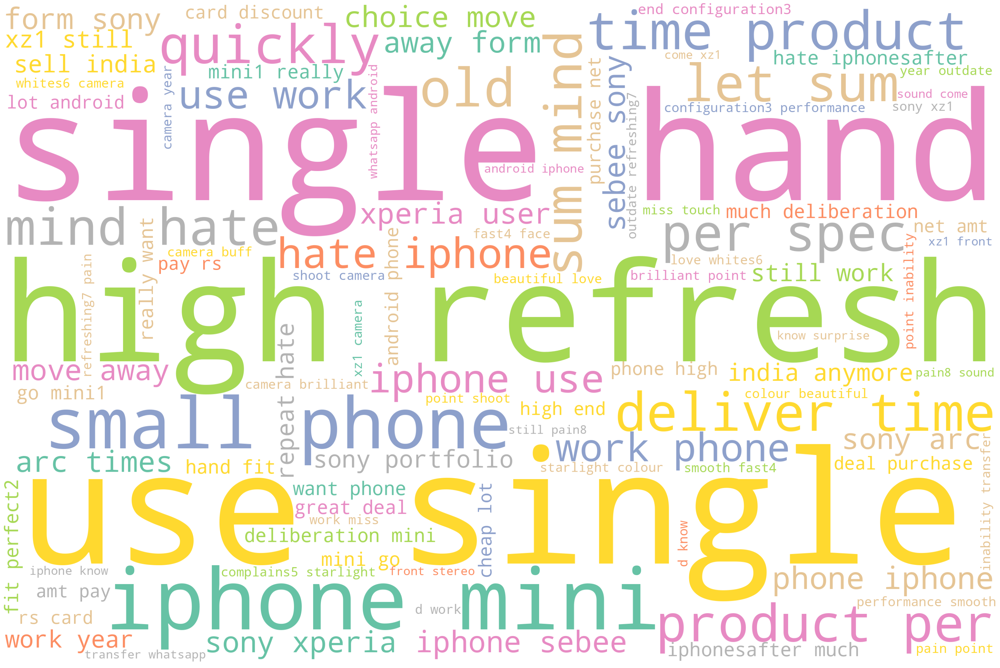

In [93]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')

# Generate word cloud

STOPWORDS.add('Pron')
wordcloud=WordCloud(width=3000,height=2000,background_color='white',max_words=100,
                   colormap='Set2',stopwords=STOPWORDS).generate(clean_reviews)
plot_cloud(wordcloud)

Nmae Entity Recognition (NER)

In [94]:
# Parts of speech (POS) tagging
nlp=spacy.load('en_core_web_sm')

one_block=clean_reviews
doc_block=nlp(one_block)
spacy.displacy.render(doc_block,style='ent',jupyter=True)

In [95]:
for token in doc_block[100:200]:
    print(token,token.pos_)

do AUX
not PART
like VERB
work NOUN
miss PROPN
touch NOUN
i PRON
d ADV
know VERB
get VERB
so ADV
complains5 ADJ
starlight VERB
colour ADJ
beautiful ADJ
love NOUN
whites6 NOUN
camera NOUN
brilliant ADJ
point NOUN
shoot NOUN
camera NOUN
buff PROPN
my PRON
sony PROPN
xz1 PROPN
camera NOUN
5 NUM
year NOUN
outdate NOUN
refreshing7 NOUN
pain NOUN
point NOUN
inability NOUN
transfer NOUN
whatsapp NOUN
android PROPN
iphone PROPN
know NOUN
surprise NOUN
but CCONJ
still ADV
pain8 ADJ
sound NOUN
come VERB
xz1 NOUN
front ADJ
stereo PROPN
experience NOUN
not PART
many ADJ
phone NOUN
sound NOUN
quality NOUN
this DET
phone NOUN
top ADJ
quality NOUN
so ADV
satisfied ADJ
quality9 NOUN
display NOUN
still ADV
love VERB
lcd NOUN
panel NOUN
but CCONJ
pretty ADV
sharp ADJ
bright ADJ
love NOUN
it10 PROPN
notch NOUN
do AUX
not PART
hurt VERB
eye NOUN
so ADV
do AUX
not PART
really ADV
care VERB
again ADV
know VERB
gettingif PROPN
power NOUN
user NOUN
concerned ADJ
battery NOUN
power NOUN
bank NOUN
may AUX
usefu

In [96]:
# Filtering the nouns and verbs only

nouns_verbs=[token.text for token in doc_block if token.pos_ in ('NOUN','VERB')]
print(nouns_verbs[100:200])

['user', 'battery', 'power', 'bank', 'feel', 'problem', 'user', 'prosform', 'factor', 'phone', 'market', 'offer', 'combination', 'ease', 'use', 'pocketability', 'performance', 'joy', 'use', 'handedbattery', 'life', 'compare', 'flagship', 'iphone', 'sufficientperformance', 'stutter', 'lag', 'freeze', 'whatsoeverdisplay', 'resolution', 'combine', 'screen', 'size', 'mean', 'density', 'rate', 'thoughcamera', 'm', 'photography', 'enthusiast', 're', 'point', 'click', 'bag', 'get', 'impression', 'design', 'intention', 'end', 'user', 'adapt', 'prefer', 'customise', 'usage', 'adapt', 'people', 'prefer', 'case', 'protector', 'accessory', 'product', 'offer', 'extraif', 'go', 'use', 'device', 'medium', 'consumption', 'see', 'phone', 'display', 'find', 'feel', 'give', 'apple', 'wall', 'nature', 'iphone', 'communication', 'device', 'entertainment', 'want', 'iphone', 'work', 'call', 'text', 'email', 'medium', 'iphone', 'model', 'iphone', 'range', 'phone', 'good', 'show', 'mobile', 'disadvantage', 'pp

In [97]:
# Counting the noun & verb tokens

from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()

X=cv.fit_transform(nouns_verbs)
sum_words=X.sum(axis=0)

words_freq=[(word,sum_words[0,idx]) for word,idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq,key=lambda x: x[1],reverse=True)

wd_df=pd.DataFrame(words_freq)
wd_df.columns=['word','count']
wd_df[0:10] # viewing top ten results

,word,count
0,phone,1560
1,iphone,1320
2,use,720
3,work,720
4,camera,720
5,get,600
6,product,480
7,performance,480
8,user,480
9,want,360


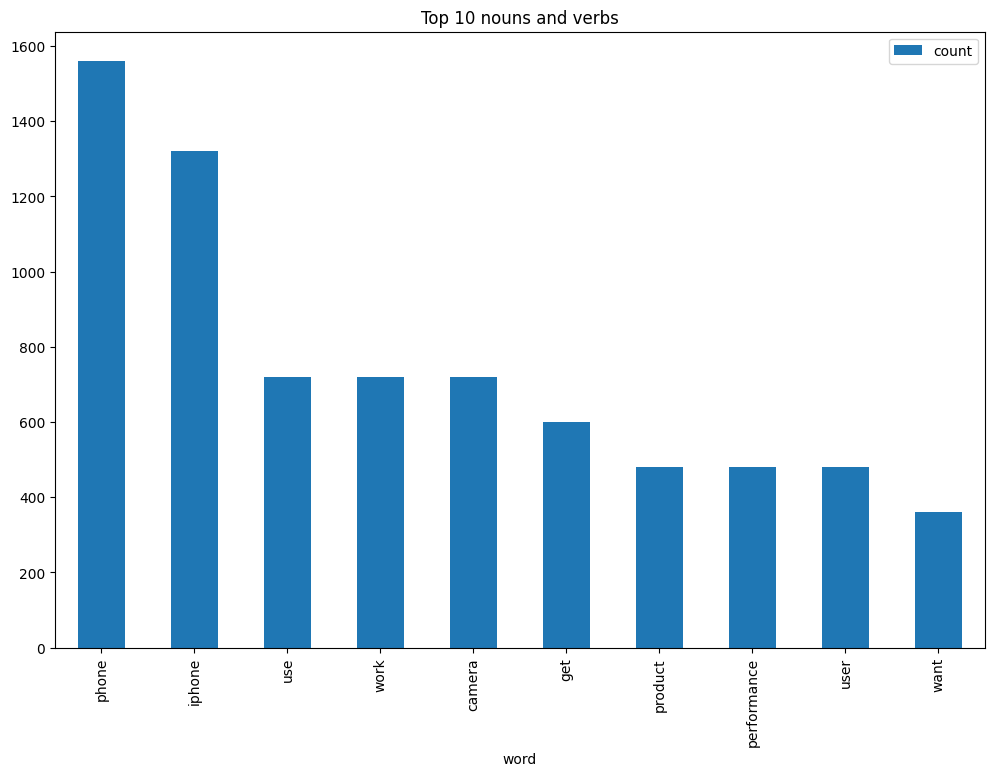

In [98]:
# Visualizing results (Barchart for top 10 nouns + verbs)
wd_df[0:10].plot.bar(x='word',figsize=(12,8),title='Top 10 nouns and verbs');

**Emotion** **mining** - **Sentiment** **Analysis**

In [99]:
from nltk import tokenize
sentences=tokenize.sent_tokenize(' '.join(reviews))
sentences

['Delivered on time and the product was as per specs.',
 'No cheating.',
 'Delivered on time and the product was as per specs.',
 'No cheating.',
 'Let me sum up my mind here.',
 'I hate Iphones.',
 "I used to have an work phone (Iphone SE).Being a Sony Xperia user since Sony Arc times, I didn't have a choice to move away form the Sony portfolio as they don't sell in India anymore.",
 'My XZ1 is still working after 5.5 years, but she is getting old.',
 'And I repeat I hate IPhones.After much deliberation between 12, 13 and 13 Mini, I went with 13 Mini.1.',
 'I really wanted a phone I could use in a single hand, it fits perfect.2.',
 'I got a great deal on the purchase, as the net amt I paid was Rs.',
 '58,900 after card discounts.',
 'So it is cheaper than a lot of Android phones with high end configuration.3.',
 'Performance.',
 'It is smooth and fast.4.',
 'Face Id works.',
 "I don't like it, but it works, I miss the Touch Id, but i knew what I was getting.",
 'So no complains.5.',
 

In [100]:
sent_df=pd.DataFrame(sentences,columns=['sentence'])
sent_df

,sentence
0,Delivered on time and the product was as per s...
1,No cheating.
2,Delivered on time and the product was as per s...
3,No cheating.
4,Let me sum up my mind here.
...,...
7978,Anything and everything.
7979,Been a iPhone user earlier also.
7980,Was skeptical about purchasing a relatively ex...
7981,"If you’re coming for a small phone, this is ba..."


In [102]:
# Emotion Lexicon - Affin
affin = pd.read_csv("/content/Afinn.csv" ,sep=',' ,encoding='latin-1')
affin

,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2
...,...,...
2472,yucky,-2
2473,yummy,3
2474,zealot,-2
2475,zealots,-2


In [105]:
affinity_scores=affin.set_index('word')['value'].to_dict()
affinity_scores

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [106]:
# Custom function: score each word in a sentence in lemmatised form, but calculate the score for the whole original sentence
nlp=spacy.load('en_core_web_sm')
sentiment_lexicon=affinity_scores

def calculate_sentiment(text:str=None):
    sent_score=0
    if text:
        sentence=nlp(text)
        for word in sentence:
            sent_score+=sentiment_lexicon.get(word.lemma_,0)
    return sent_score

In [107]:
# manual testing
calculate_sentiment(text='good service')

3

In [108]:
# Calculating sentiment value for each sentence
sent_df['sentiment_value']=sent_df['sentence'].apply(calculate_sentiment)
sent_df['sentiment_value']

0        0
1       -1
2        0
3       -1
4        0
        ..
7978     0
7979     0
7980     3
7981    22
7982     5
Name: sentiment_value, Length: 7983, dtype: int64

In [109]:
# how many words are there in a sentence?
sent_df['word_count']=sent_df['sentence'].str.split().apply(len)
sent_df['word_count']

0       10
1        2
2       10
3        2
4        7
        ..
7978     3
7979     6
7980    44
7981    79
7982    18
Name: word_count, Length: 7983, dtype: int64

In [110]:
sent_df.sort_values(by='sentiment_value')

,sentence,sentiment_value,word_count
5806,The only pain point is inability to transfer W...,-4,13
5113,The only pain point is inability to transfer W...,-4,13
6787,The only pain point is inability to transfer W...,-4,13
2934,The only pain point is inability to transfer W...,-4,13
4144,The only pain point is inability to transfer W...,-4,13
...,...,...,...
6980,"If you’re coming for a small phone, this is ba...",22,79
7981,"If you’re coming for a small phone, this is ba...",22,79
7648,"If you’re coming for a small phone, this is ba...",22,79
2589,"If you’re coming for a small phone, this is ba...",22,79


In [111]:
# Sentiment score of the whole review
sent_df['sentiment_value'].describe()

count    7983.000000
mean        1.428035
std         3.580243
min        -4.000000
25%         0.000000
50%         0.000000
75%         2.000000
max        22.000000
Name: sentiment_value, dtype: float64

In [112]:
# negative sentiment score of the whole review
sent_df[sent_df['sentiment_value']<=0]

,sentence,sentiment_value,word_count
0,Delivered on time and the product was as per s...,0,10
1,No cheating.,-1,2
2,Delivered on time and the product was as per s...,0,10
3,No cheating.,-1,2
4,Let me sum up my mind here.,0,7
...,...,...,...
7973,Battry life is average.,0,4
7976,My iPhone SE 128GB 1st Generation from 2018 (c...,0,16
7977,Apple continues to find new methods to irritat...,0,11
7978,Anything and everything.,0,3


In [113]:
# positive sentiment score of the whole review
sent_df[sent_df['sentiment_value']>0]

,sentence,sentiment_value,word_count
9,I really wanted a phone I could use in a singl...,2,15
10,"I got a great deal on the purchase, as the net...",2,16
18,The Starlight colour is beautiful.,3,5
19,I love whites.6.,3,3
20,Camera is brilliant.,4,3
...,...,...,...
7974,Camera is perfect Product is just fantastic bu...,7,11
7975,The Cameras do not support Macro/Close-up shots.,2,7
7980,Was skeptical about purchasing a relatively ex...,3,44
7981,"If you’re coming for a small phone, this is ba...",22,79


In [114]:
# Adding index cloumn
sent_df['index']=range(0,len(sent_df))
sent_df

,sentence,sentiment_value,word_count,index
0,Delivered on time and the product was as per s...,0,10,0
1,No cheating.,-1,2,1
2,Delivered on time and the product was as per s...,0,10,2
3,No cheating.,-1,2,3
4,Let me sum up my mind here.,0,7,4
...,...,...,...,...
7978,Anything and everything.,0,3,7978
7979,Been a iPhone user earlier also.,0,6,7979
7980,Was skeptical about purchasing a relatively ex...,3,44,7980
7981,"If you’re coming for a small phone, this is ba...",22,79,7981


<Axes: xlabel='sentiment_value', ylabel='Density'>

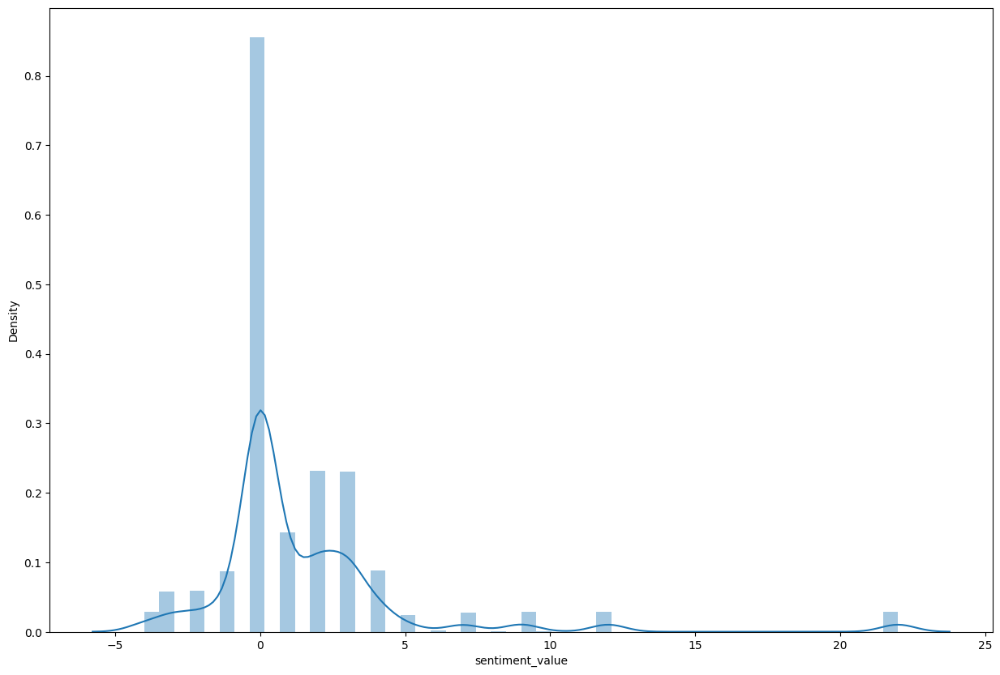

In [115]:
# Plotting the sentiment value for whole review

import seaborn as sns
plt.figure(figsize=(15,10))
sns.distplot(sent_df['sentiment_value'])

<Axes: xlabel='index', ylabel='sentiment_value'>

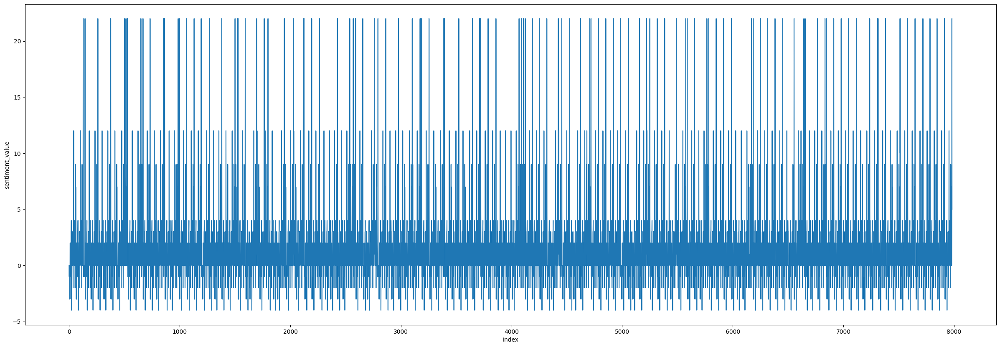

In [119]:
# Plotting the line plot for sentiment value of whole review

plt.figure(figsize=(30,10))
sns.lineplot(y='sentiment_value',x='index',data=sent_df)